# <a href="https://miptstats.github.io/courses/ad_fivt.html">Введение в анализ данных</a>
## Домашнее задание 3. Простой анализ данных.

**Правила, <font color="red">прочитайте внимательно</font>:**

* Выполненную работу нужно отправить телеграм-боту `@miptstats_ds23_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Дождитесь подтверждения от бота, что он принял файл. Если подтверждения нет, то что-то не так. **Работы, присланные иным способом, не принимаются.**
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`**.
* Телеграм не разрешает боту получать файлы более **20 Мб**. Если ваше решение весит больше, *заранее* разделите ноутбук на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания **используйте этот ноутбук в качестве основы, ничего не удаляя из него**. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*

**Перед выполнением задания посмотрите презентацию по выполнению и оформлению домашних заданий с занятия 2.**

---

**Баллы за задание:**

<b><font color="blue">Легкая часть</font></b> (достаточно на "хор"):
* Задача 1 &mdash; 60 баллов

<b><font color="orange">Сложная часть</font></b> (необходимо на "отл"):
* Задача 2 &mdash; 80 баллов

---

In [1]:
# Bot check

# HW_ID: fpmi_ad3
# Бот проверит этот ID и предупредит, если случайно сдать что-то не то

# Status: final
# Перед отправкой в финальном решении удали "not" в строчке выше
# Так бот проверит, что ты отправляешь финальную версию, а не промежуточную

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid", font_scale=1.3, palette="Set2")

### <font color="blue"><i>Легкая часть</i></font>


### Задача 1.

# На занятии мы уже <a href="https://miptstats.github.io/courses/ad_fivt/titanik.html" target="_blank">начинали</a> работать с датасетом Титаник. Сейчас ваша задача &mdash; на основе простого анализа предоставленных данных получить некоторое приближенное правило определения, выжил пассажир или нет.

#### 1. Подготовка данных

Загрузите данные с помощью `pandas`.

In [3]:
df = pd.read_csv("train.csv")

Разделите данные по строкам на две части случайным образом в соотношении 7:3. Первую часть мы будем называть *обучающей*, а вторую &mdash; *тестовой*.

In [4]:
train = df.sample(frac=0.7, random_state=24309)
test = df.drop(train.index)

Из каждой части оставим несколько признаков, с которыми мы будем работать, а также отдельно &mdash; целевой признак. Примените к обеим частям таблицы функцию ниже

In [5]:
features_columns = ["Pclass", "Sex", "Age", "SibSp", "Parch", "Fare"]
target_column = "Survived"  # Целевой признак


def get_features_and_target(data):
    """
    Выделяет признаки с которыми будем работать и целевой
    """
    data_copy = data.reset_index()
    features = data_copy[features_columns]
    target = data_copy[target_column]
    return features, target

In [6]:
train_features, train_target = get_features_and_target(train)
train_features
train_target

0      0
1      0
2      0
3      1
4      0
      ..
619    0
620    0
621    0
622    0
623    0
Name: Survived, Length: 624, dtype: int64

#### 2. Исследование

**Внимание.** Эта часть задачи должна выполняться *исключительно на обучающих данных*. За использование тестовых данных решение не будет оценено.

Проведите визуальный анализ данных чтобы понять, как различные признаки влияют на целевой. Исследовать можно не целиком обучающие данные, а разделить их на две части по одному из признаков, а далее рассматривать каждую часть отдельно. 

*Не забывайте про информативность и эстетичность графиков.*

Посмотрим на зависимость "вероятности" выживания от Пола

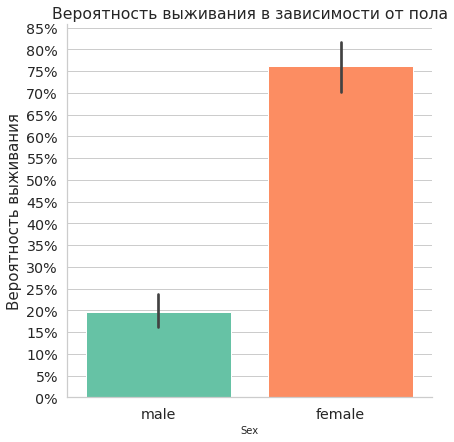

In [7]:
from matplotlib.ticker import PercentFormatter

g = sns.catplot(
    data=train[["Sex", "Survived"]].dropna(),
    x="Sex",
    y="Survived",
    kind="bar",
    aspect=1,
    saturation=1.5,
    height=6,
)
plt.yticks(np.arange(0, 0.9, step=0.05))
plt.title("Вероятность выживания в зависимости от пола")
plt.ylabel("Вероятность выживания", fontsize=15)
g.axes.flat[0].yaxis.set_major_formatter(PercentFormatter(1))
plt.show()

#### Краткий вывод из графика:
Мужчиный выживают с очень низкой вероятностью, а женщины с большой

Посмотрим на зависимость "вероятности" выживания от класса

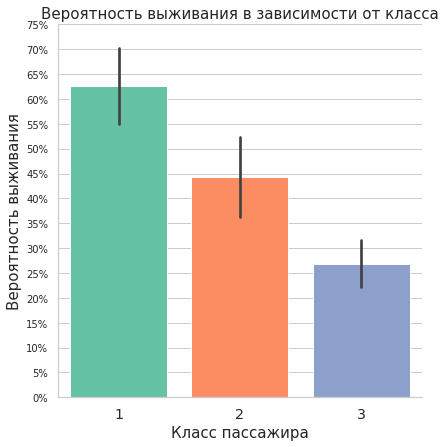

In [8]:
g = sns.catplot(
    data=train[["Pclass", "Survived"]].dropna(),
    x="Pclass",
    y="Survived",
    kind="bar",
    aspect=1,
    saturation=1.5,
    height=6,
)
plt.yticks(np.arange(0, 0.8, step=0.05), fontsize=10)
plt.title("Вероятность выживания в зависимости от класса", fontsize=15)
plt.ylabel("Вероятность выживания", fontsize=15)
plt.xlabel("Класс пассажира", fontsize=15)
g.axes.flat[0].yaxis.set_major_formatter(PercentFormatter(1))
plt.show()

#### Краткий вывод из графика:
чем больший по номеру класс тем меньше вероятность выжить, причем достаточно существенно

Разделим данный график еще и по полу(Sex)

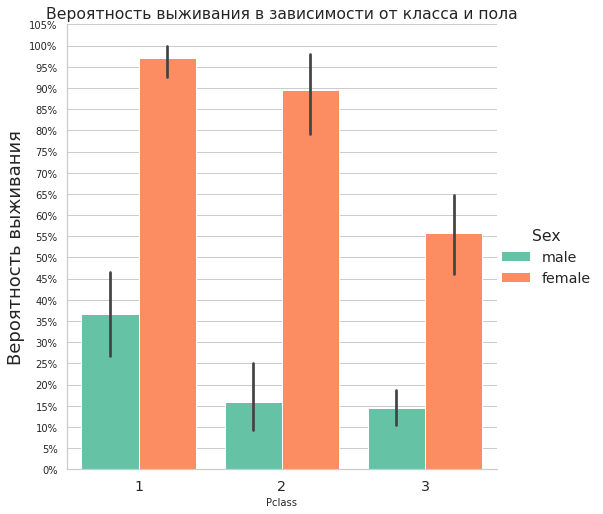

In [9]:
g = sns.catplot(
    data=train[["Pclass", "Survived", "Sex"]].dropna(),
    x="Pclass",
    y="Survived",
    hue="Sex",
    kind="bar",
    saturation=1.5,
    height=7,
)
plt.yticks(np.arange(0, 1.1, step=0.05), fontsize=10)
plt.title("Вероятность выживания в зависимости от класса и пола")
plt.ylabel("Вероятность выживания", fontsize=18)
g.axes.flat[0].yaxis.set_major_formatter(PercentFormatter(1))
plt.show()

#### Краткий вывод из графика:
1) Для любого из классов видно: что шанс выжить у мужчин сильно ниже чем у женщин  
2) Мужчины из 1 класса выживали сильно чаще(примерно в 2 раза) чем мужичны из 2 и 3 го  
3) женщины из 1го и 2го классов выживали примерно равновероятно, а из 3го сильно реже`

Выделим отдельно датасеты с выжившими и не выжившими

In [10]:
survived, t = get_features_and_target(train[train["Survived"] == 1].copy())
non_survived = train_features.drop(survived.index)

Построим графики плотности возраста

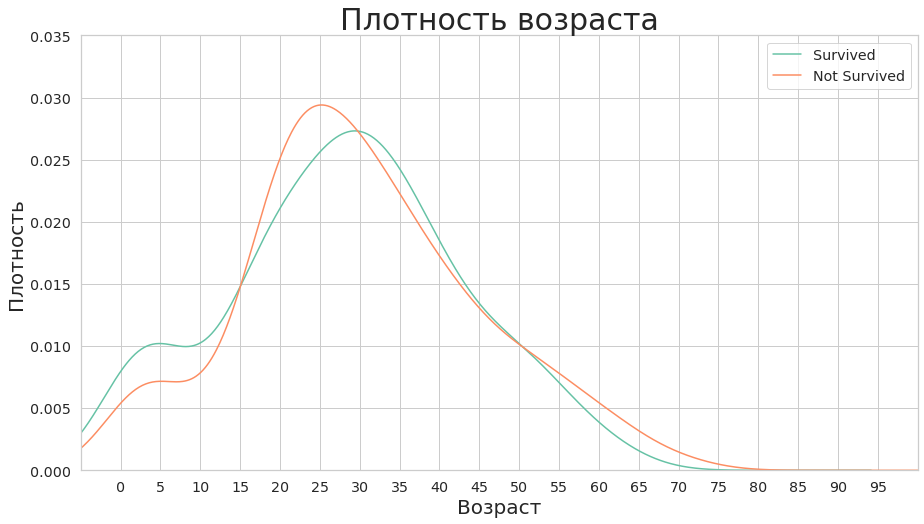

In [11]:
import scipy
import matplotlib.ticker as ticker

fig, ax = plt.subplots(figsize=(15, 8))

survived.Age.dropna().plot(kind="density")
non_survived.Age.dropna().plot(kind="density")

plt.title("Плотность возраста", size=30)
plt.xlabel("Возраст", size=20)
plt.ylabel("Плотность", size=20)
plt.legend(["Survived", "Not Survived"])

ax.set(xlim=(-5, 100), ylim=(0, 0.035))

plt.xticks(np.arange(0, 100, step=5))
plt.show()

#### Краткий вывод:
1)дети(до 10 лет) чаще выживали (скачок в начале) на синем графике  
2)Если человек старше +-12 лет то скорее всего возраст не влияет

Теперь можно рассмотреть те же графики что в начале, но разделять мужчин женщин и детей до 10

In [12]:
three_sex_df = train.copy()[["Age", "Sex", "Pclass", "Survived"]]
three_sex_df.loc[three_sex_df["Age"] <= 12, "Sex"] = "child"
print("Число детей в классе: ")
print(
    three_sex_df[three_sex_df.Sex == "child"]
    .groupby(by="Pclass")
    .count()
    .copy()[["Age"]]
    .rename(columns={"Age": "Num"})
)

Число детей в классе: 
        Num
Pclass     
1         2
2        12
3        34


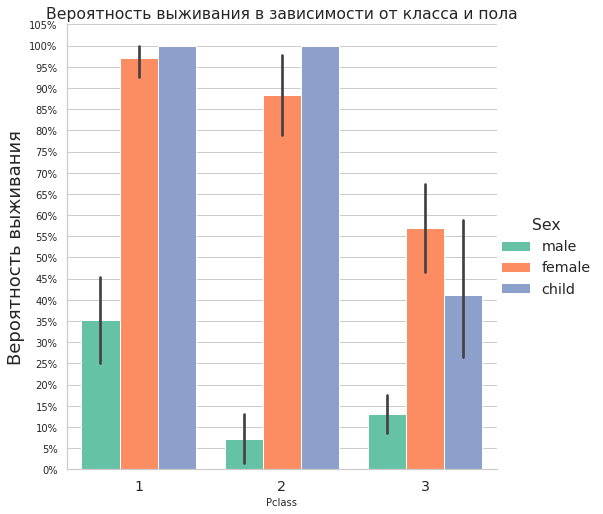

In [13]:
g = sns.catplot(
    data=three_sex_df[["Pclass", "Survived", "Sex"]].dropna(),
    x="Pclass",
    y="Survived",
    hue="Sex",
    kind="bar",
    saturation=1.5,
    height=7,
)
plt.yticks(np.arange(0, 1.1, step=0.05), fontsize=10)
plt.title("Вероятность выживания в зависимости от класса и пола")
plt.ylabel("Вероятность выживания", fontsize=18)
g.axes.flat[0].yaxis.set_major_formatter(PercentFormatter(1))
plt.show()

#### Краткий вывод из графика: 
1) В классе 1 никаких выводов о детях сделать нельзя - слишком малая выборка  
2) Во 2 классe большинство(а при моей выборке даже все) дети выжили.  
3) В 3 классе дети спасались примерно так же часто как и женщины  

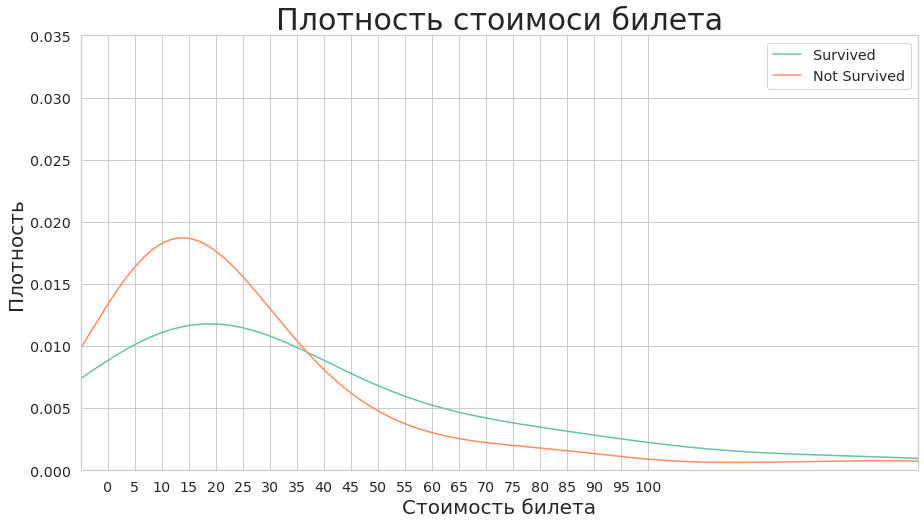

In [14]:
fig, ax = plt.subplots(figsize=(15, 8))
survived.Fare.dropna().plot(kind="density")
non_survived.Fare.dropna().plot(kind="density")
plt.title("Плотность стоимоси билета", size=30)
plt.xlabel("Стоимость билета", size=20)
plt.ylabel("Плотность", size=20)
plt.legend(["Survived", "Not Survived"])
ax.set(xlim=(-5, 150), ylim=(0, 0.035))
plt.xticks(np.arange(0, 105, step=5))
plt.show()

#### Краткий вывод:
1) Гипотеза: Дешевые билеты(до 30) гораздо чаще не выживают.

Посмотрим на отличие в кол-ве выживших со стоимостью до и после 25

Число пассажиров с дорогими / не дорогими билетами
           Num
expensive     
False      389
True       235


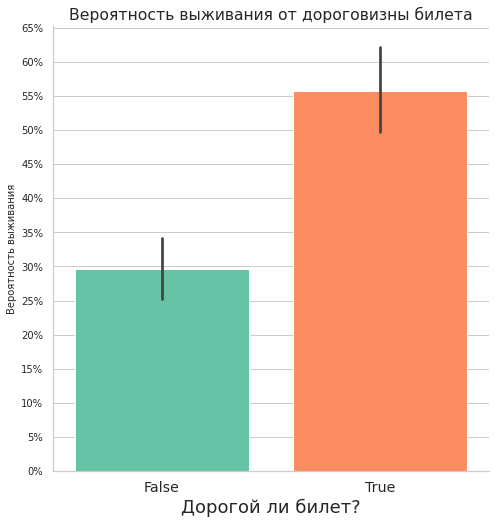

In [15]:
cost_separation = train[["Fare", "Survived"]]
cost_separation.insert(2, "expensive", cost_separation.Fare > 25)
counter = cost_separation.groupby(by="expensive", as_index=True).count()
print("Число пассажиров с дорогими / не дорогими билетами")
print(counter[["Survived"]].rename(columns={"Survived": "Num"}).dropna())


g = sns.catplot(
    data=cost_separation.dropna(),
    x="expensive",
    y="Survived",
    kind="bar",
    saturation=1.5,
    height=7,
)
plt.yticks(np.arange(0, 0.7, step=0.05), fontsize=10)
plt.title("Вероятность выживания от дороговизны билета")
plt.ylabel("Вероятность выживания")
plt.xlabel("Дорогой ли билет?", fontsize=18)
g.axes.flat[0].yaxis.set_major_formatter(PercentFormatter(1))
plt.show()

#### Краткий вывод из графика:  
1) Если билет дорогой(более 25) то ничего нельзя сказать  
2) Если билет дешевый (<=25), то человек скорее не выжил (при прочих равных)

Рассмотрим вероятность выжить в зависимости от параметра Parch(при этом Parch >= 3 анализировать не будем т.к. очень мало данных)

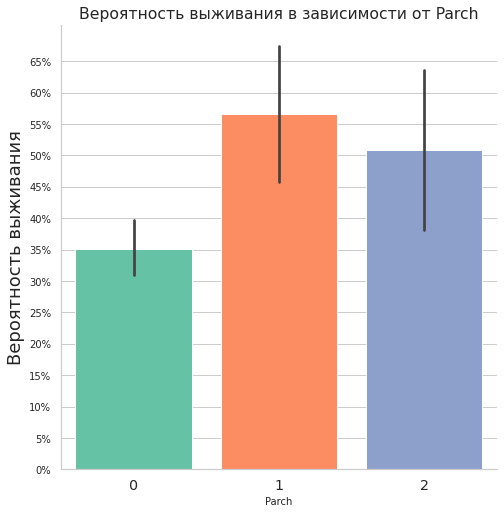

In [16]:
g = sns.catplot(
    data=train[train.Parch <= 2][["Parch", "Survived"]].dropna(),
    x="Parch",
    y="Survived",
    kind="bar",
    saturation=1.5,
    height=7,
)
plt.yticks(np.arange(0, 0.7, step=0.05), fontsize=10)
plt.title("Вероятность выживания в зависимости от Parch")
plt.ylabel("Вероятность выживания", fontsize=18)
g.axes.flat[0].yaxis.set_major_formatter(PercentFormatter(1))
plt.show()

#### Краткие выводы:
1) Для Parch == 0 вероятность менее 35% - то при прочих равных скорее такой человек не выживет   
2) Для Parch == 1 : около 50% - то ничего про их выживание сказать нельзя  
3) Для Parch == 2 : вероятность чуть менее 45% т.е. при прочих равных можно положить что не выживает.

Рассмотрим зависимость вероятности выживания в зависимости от параметра SibSp

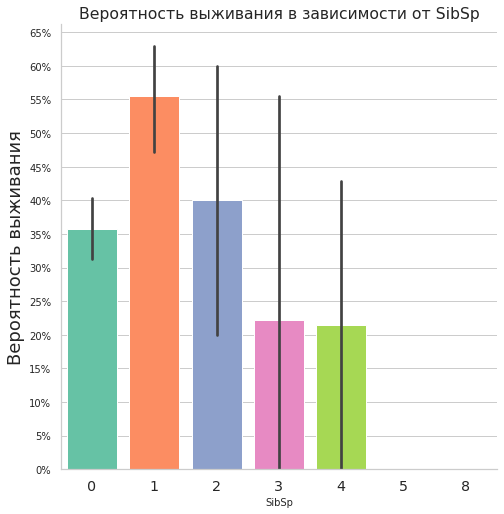

In [17]:
g = sns.catplot(
    data=train[["SibSp", "Survived"]].dropna(),
    x="SibSp",
    y="Survived",
    kind="bar",
    saturation=1.5,
    height=7,
)
plt.yticks(np.arange(0, 0.7, step=0.05), fontsize=10)
plt.title("Вероятность выживания в зависимости от SibSp")
plt.ylabel("Вероятность выживания", fontsize=18)
g.axes.flat[0].yaxis.set_major_formatter(PercentFormatter(1))
plt.show()

#### Краткие выводы:
1) Если SibSp == 0, то при прочих равных вероятнее человек не выживет  
2) Если SibSp == 1, то ничего сказать нельзя т.к. около 50%  
3) Если SibSp >= 2, то опять же ничего не сказать изза малой выборки  

## Общие выводы:


1) Женщины 1го и 2го классов вероятнее всего выживут, женщины 3го класса - не понятно  
2) мужчиные 2 и 3-го классов вероятнее не выживут, мужчины 1го класса выживут с вероятностью +- 35%.  
3) Дети 2го и 3го классов скорее выживут, про первый ничего не скажешь
4) Это возможно связано с Pclass, но всеже, если стоимость билета ниже примерно 25, то вероятность выжить заметно снижается  
5) Без родственников типа Parch вероятность выжить снижается примерно до 35%, про ситуации когда родственники этого типа есть ничего сказать нельзя  
6) Без родственниеов типа SibSp вероятность выжить снижается примерно до 35%, в остальных случаях ничего не скажешь

# 3. Классификация

На основе проведенного исследования предложите два разных правила в виде решающего дерева, пример которого можете посмотреть в презентации с первой лекции (классификация котиков). Никакие статистические методы использовать не требуется, только логику и графики.

В данной задаче достаточно, если первое дерево будет иметь максимальную глубину 2, а второе &mdash; глубину 1, и при этом не является поддеревом первого. *Примечание*: дерево из одного листа имеет глубину 0.

**Дерево 1:**  

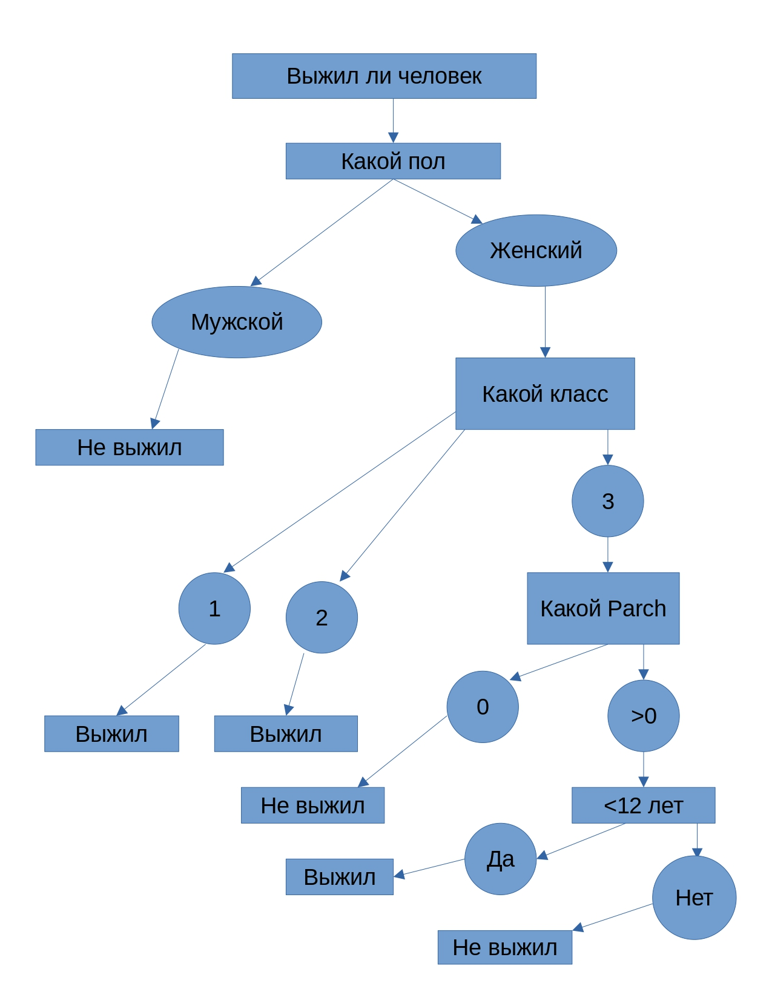



**Дерево 2:**
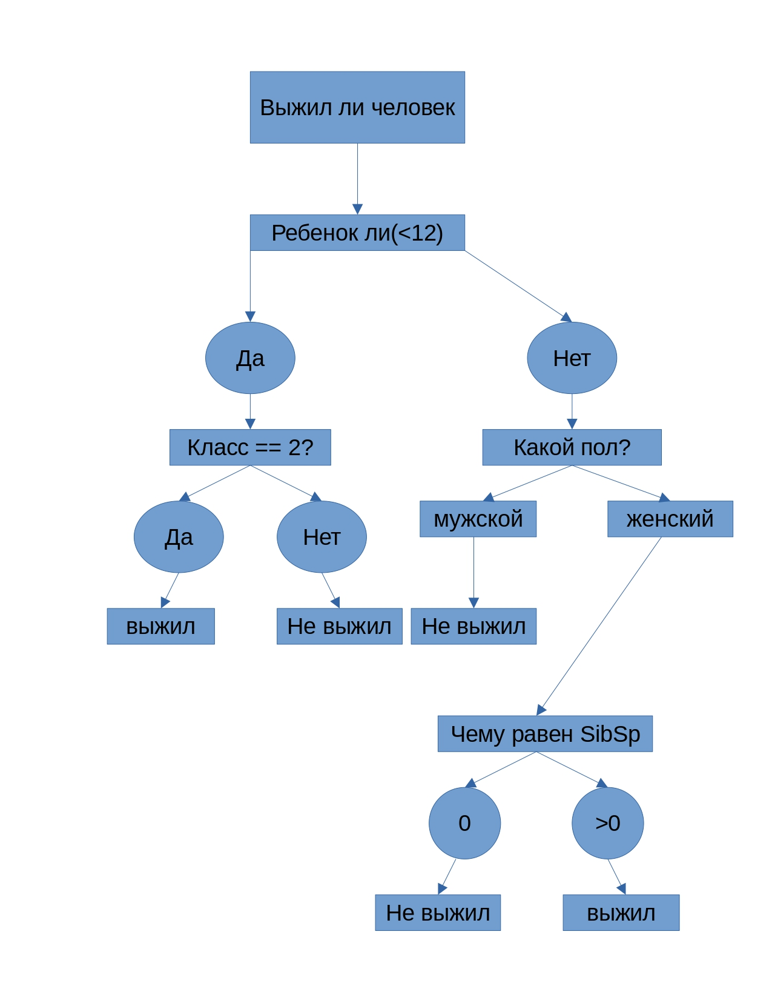


Реализуйте полученные деревья по шаблону

In [18]:
def tree1(features):
    """
    Предсказание целевого признака для данных features -- pandas-таблица данных.
    Возвращает pandas.Series с теми же индексами, что и у features.
    """
    features = features.copy()
    features["Survived"] = 0
    fem = features.Sex
    class_ = features.Pclass
    Parch = features.Parch
    Age = features.Age
    features[
        (fem == "female") & ((class_ <= 2) | ((Parch > 0) & (Age < 12)))
    ] = 1
    predicted = features.reset_index()["Survived"]
    return predicted

In [19]:
def tree2(features):
    """
    Предсказание целевого признака для данных features -- pandas-таблица данных.
    Возвращает pandas.Series с теми же индексами, что и у features.
    """
    features = features.copy()
    features["Survived"] = 0
    fem = features.Sex
    class_ = features.Pclass
    Sib = features.SibSp
    Age = features.Age
    features[
        ((Age <= 12) & (class_ == 2)) | ((Age > 12) & (fem == "female") & (Sib > 0))
    ] = 1
    predicted = features.reset_index()["Survived"]
    return predicted

#### 4. Качество

Вспомним, что у нас имеется тестовая часть выборки. Самое время ее использовать для того, чтобы оценить, насколько хорошими получились деревья. Предложите какой-нибудь критерий качества.

*Замечание*. Не стоит пытаться искать, какие критерии существуют. В данном случае легко предложить адекватный критерий. Стандартные критерии мы разберем позже, но для начала лучше подумать самостоятельно.

**Критерий:**

( число строк, где survived совпали с тестовой выборкой) / (общее число строк в тестовой выборке)

Реализуйте данный критерий по шаблону

In [20]:
def criteria(target, predicted):
    return (target == predicted).sum() / len(target)

Посчитайте качество полученных ранее деревьев.

*Примечание.* Полученные значения не влияют на оценку по задание. Оценивается только корректность и обоснованность решения, а также графики и выводы.

In [21]:
features, target = get_features_and_target(test)

print("tree1 criteria: ", round(criteria(target, tree1(features)), 3))
print("tree2 criteria: ", round(criteria(target, tree2(features)), 3))

tree1 criteria:  0.82
tree2 criteria:  0.727


**5. Метод ближайшего соседа**

В домашнем задании 1 вы уже реализовали функцию поиска ближайших соседей. Теперь давайте применим ее для решения нашей текущей задачи. 

Реализуйте функцию, которая для каждого объекта тестового набора данных найдет $k$ ближайших соседей из обучающего набора данных, и в качестве ответа возьмет наиболее часто встречающееся значение целевого признака среди найденных соседей. Обратите внимание, что соседей необходимо искать только среди объектов обучающего набора данных.

In [22]:
def normalize(series):
    """
    нормализует данные series - любой промежуток -> [0, 100]
    """
    series = (series - min(series)) * 100 / (max(series) - min(series))
    return series


def preprocess(features):
    """
    Готовит данные к поискам соседей

    """
    copy = features.copy()

    copy.Pclass = normalize(copy.Pclass)

    copy["Sex"] = copy["Sex"].apply(lambda x: 100 if x == "male" else 0)

    copy.Age = normalize(copy.Age)
    copy.SibSp = normalize(copy.SibSp)
    copy.Parch = normalize(copy.Parch)

    copy[features.columns] = copy[features.columns].fillna(
        copy[features.columns].mean()
    )

    return copy

Это из первого контеста поиск матрицы индексов ближайших соседей:

In [23]:
def find_dist_matr(A: np.ndarray, B: np.ndarray) -> np.ndarray:
    """
    Ищет матрицу попарных расстояний(было в задании 1)
    """
    A1 = np.expand_dims(A.transpose(), axis=0)
    B1 = np.expand_dims(B, axis=2)
    D = ((A1 - B1) * (A1 - B1)).sum(axis=1)
    return D


def find_nearest_points(A: np.ndarray, B: np.ndarray, k: int) -> np.ndarray:
    """
    Ищет матрицу индексов ближайших соседей (было в зад 1)
    """
    Dists = find_dist_matr(A, B)
    Idxs = np.argsort(Dists)
    return Idxs[:, :k]

Определяем по вектору из 0 и 1 ближайших соседей выжил ли человек

In [24]:
def is_survived(target, idx_arr):
    return int(target[idx_arr].sum() / len(idx_arr) >= 1 / 2)

In [25]:
def knn(features, train_features, train_target, k=1):
    """
    Предсказание целевого признака для данных features -- pandas-таблица данных.
    на основе обучающего набора данных train_features, train_target.
    Возвращает pandas.Series с теми же индексами, что и у features.
    Число k -- количество соседей.
    """
    Idxs = find_nearest_points(
        preprocess(train_features).to_numpy(), preprocess(features).to_numpy(), k
    )
    predicted = pd.Series([is_survived(train_target, ans) for ans in Idxs])

    return predicted

In [26]:
test_feat, test_target = get_features_and_target(test)
train_feat, train_target = get_features_and_target(train)

Посчитайте значение предложенного ранее критерия качества для метода ближайшего соседа для значений $k$ от 1 до 10. Постройте график зависимости критерия качества от $k$. Как вы можете пояснить полученные результаты?

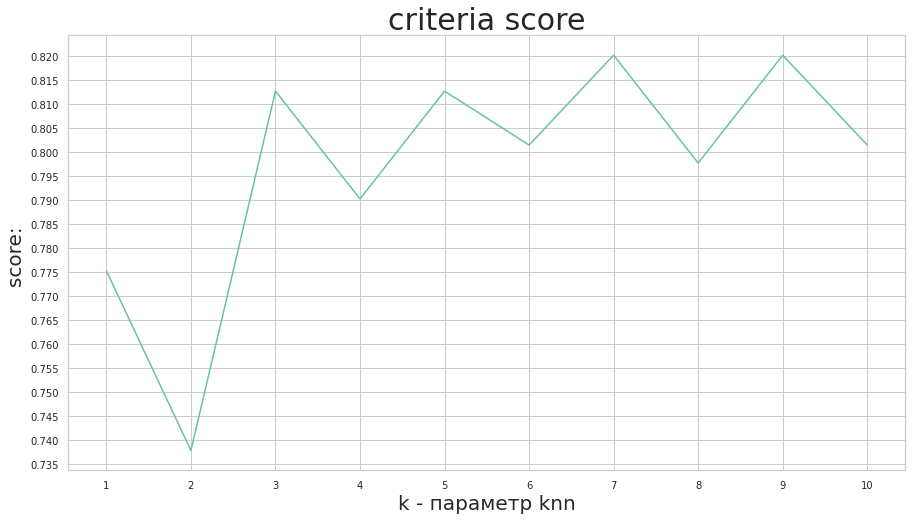

In [27]:
x_min, x_max = 1, 10
data = np.array(
    [
        criteria(test_target, knn(test_feat, train_feat, train_target, k))
        for k in range(x_min, x_max + 1, 1)
    ]
)
fig, ax = plt.subplots(figsize=(15, 8))
plt.xticks(np.arange(x_min, x_max + 1, step=1), fontsize=10)
plt.yticks(np.arange(0, 1, step=0.005), fontsize=10)
plt.title("criteria score", size=30)
plt.xlabel("k - параметр knn", size=20)
plt.ylabel("score: ", size=20)
ax.plot(np.arange(x_min, x_max + 1, step=1), data)
plt.show()

#### Пояснения:
1) на графике наблюдаются перепады, но обычно при k около 5-7 - наблюдается подъем  
2) график колеблется около нескольких процентов(примерно от 72 до 84  
3) объяснить данный момент можно тем, что при малом числе соседей большое влияние для некоторых людей оказывают те чиса которые формально ближе, отднако не сильно похоже на исходных  
4) данные сильно колеблются в рамках данных процентов, что может сведетельствовать о том что выбор k довольно важен  

#### 6. Выводы
1) в приведенных train было достаточно мало данных(просто мало людей) чтобы учесть все приведенные features  
2) Часто поверхностный анализ помогает увидеть важные зависимости  
3) Различные графики в различных ситуациях помогают и нужно грамотно подходить к их выбору  
4) Даже банальный knn с очевидной нормализацией помогает очень неплохо  


---
### <font color="orange"><i>Сложная часть</i></font>

### Задача 2

<a target="_blank" href="yelp.com">Yelp</a> — веб-сайт для поиска на местном рынке услуг, например ресторанов или парикмахерских, с возможностью добавлять и просматривать рейтинги и обзоры этих услуг. Для популярных бизнесов имеются сотни обзоров. Для обозревателей на сайте предусмотрены элементы социальной сети.

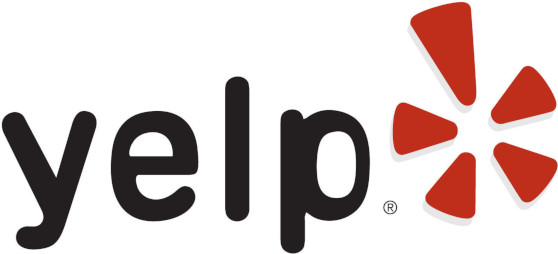

_____________

Вам предоставляется следующая информация о компаниях на Yelp:

Файл `yelp_business.csv`:
* `business_id` — уникальный идентификатор компании;
* `name` — имя компании;
* `address`, `city`, `state` — месторасположении компании;
* `latitude`, `longitude` — географические координаты;
* `categories` — категории услуг компании.

Файл `yelp_review.csv`, содержащий оценки пользователей:
* `business_id` — идентификатор компании, соответствующий файлу `yelp_business.csv`;
* `stars` — поставленная пользователем оценка от 1 до 5.

В целях сокращения объема файла, текстовые отзывы пользователей не были включены.

Оригинальную версию датасета в формате `json` можно посмотреть по <a target="_blank" href="https://www.kaggle.com/yelp-dataset/yelp-dataset/data">ссылке</a>.

_____________

**Что нужно сделать:** 

* Найти город с наибольшим количеством компаний;
* Для этого города определить районы с наиболее качественными услугами. <a target="_blank" href="https://yandex.ru/company/researches/2017/msk_mobile_map">Пример</a> с несколько другой задачей.
* А также найти рестораны с наилучшими отзывами.

------

#### Город с наибольшим количеством компаний

Загрузите данные из файла `yelp_business.csv` с помощью функции `pd.read_csv`. Посмотрите на первые несколько строк с помощью метода `head`.

In [28]:
businesses = pd.read_csv("yelp_business.csv")
businesses.head(6)

,Unnamed: 0,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
0,0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",NaN,"""4855 E Warner Rd, Ste B9""",Ahwatukee,AZ,85044,33.330690,-111.978599,1,Dentists;General Dentistry;Health & Medical;Or...
1,1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",NaN,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",NaN,"""6025 N 27th Ave, Ste 1""",Phoenix,AZ,85017,33.524903,-112.115310,1,Departments of Motor Vehicles;Public Services ...
3,3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",NaN,"""5000 Arizona Mills Cr, Ste 435""",Tempe,AZ,85282,33.383147,-111.964725,0,Sporting Goods;Shopping
4,4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,1,American (New);Nightlife;Bars;Sandwiches;Ameri...
5,5,o9eMRCWt5PkpLDE0gOPtcQ,"""Messina""",NaN,"""Richterstr. 11""",Stuttgart,BW,70567,48.727200,9.147950,1,Italian;Restaurants


Найдите пять городов, по которым присутствует информация о наибольшем количестве компаний. В таблице должен быть указан город (название) и количество компаний в этом городе.

*Подсказка.* Для выполнения стоит воспользоваться методами `groupby`, `count`, `sort_values`, `head`.

In [29]:
max_businesses = (
    businesses.groupby(by="city", as_index=False)
    .count()
    .sort_values(by="business_id", ascending=False)[["city", "business_id"]][0:5]
)
max_businesses.rename(columns={"business_id": "num of businesses"}, inplace=True)
print(max_businesses)

           city  num of businesses
424   Las Vegas              26775
713     Phoenix              17213
983     Toronto              17206
143   Charlotte               8553
871  Scottsdale               8228


Пусть `N` &mdash; город с наибольшим количеством компаний. Оставьте в таблице только записи, соответствующие городу `N`. Нанесите все эти компании на график, в котором по оси $x$ отметьте долготу, а по оси $y$ &mdash; широту.

In [30]:
N = max_businesses.city[max_businesses.index[0]]
businesses = businesses[businesses.city == N]

Сам город находится в сгустке точек. Есть какие-то компании, которые приписаны к этому городу, но находятся далеко от него. Избавьтесь от них, подобрав некоторые границы значений широты и долготы. Изобразите все компании на новом графике. На этом графике должны выделяться некоторые улицы. 

In [31]:
q_lat_min = businesses.latitude > businesses.latitude.quantile(0.01)
q_lat_max = businesses.latitude < businesses.latitude.quantile(0.99)
q_lon_min = businesses.longitude > businesses.longitude.quantile(0.01)
q_lon_max = businesses.longitude < businesses.longitude.quantile(0.99)
businesses = businesses[q_lat_min & q_lat_max & q_lon_max & q_lon_min]

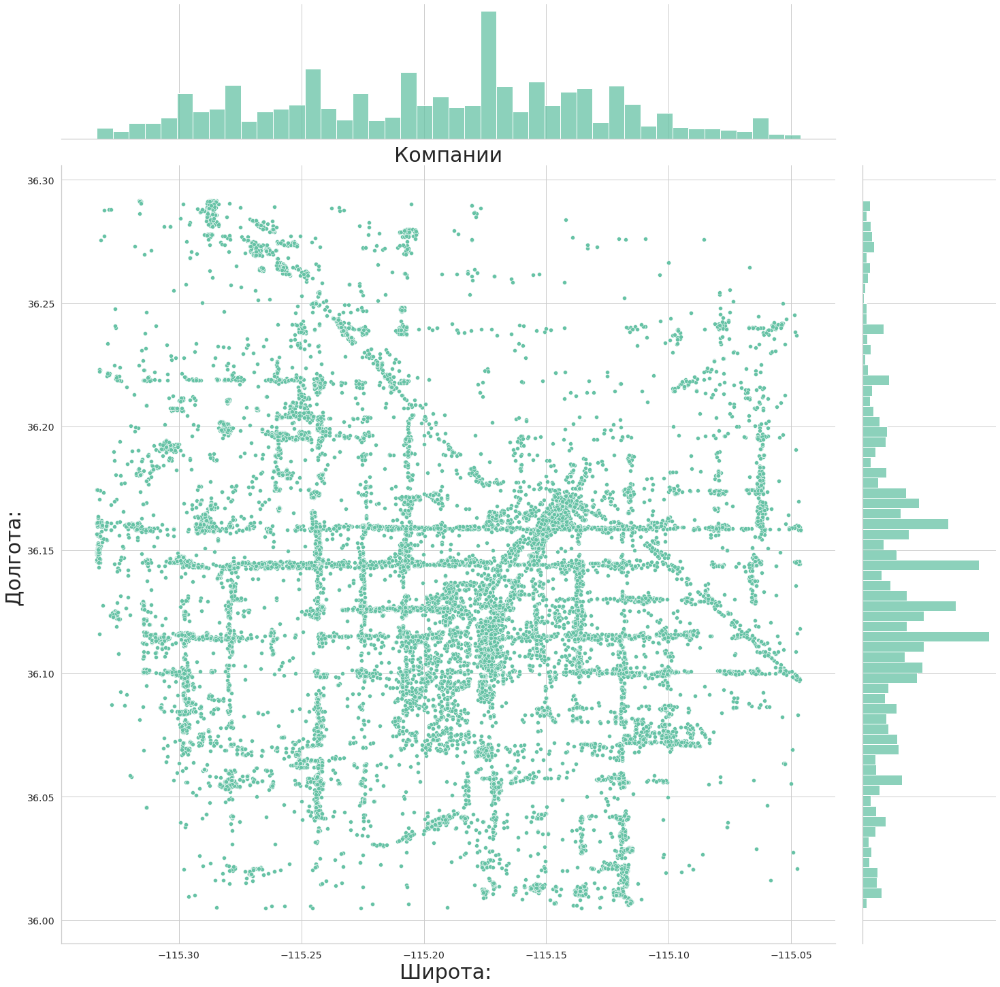

In [32]:
sns.jointplot(data=businesses, y="latitude", x="longitude", height=20)
plt.title("Компании", size=30)
plt.xlabel("Широта: ", size=30)
plt.ylabel("Долгота: ", size=30)
plt.show()

Разберитесь с тем, как подгрузить интерактивную карту города в качестве фона графика. Можно пойти двумя следующими способами.
1. Изучить <a href="https://miptstats.github.io/courses/python/11_plotly.html" target="_blank">материалы</a> по библиотеке <a href="https://plotly.com/python/" target="_blank"><b>Plotly</b></a>. Возможно, потребуется также заглянуть в документацию.
1. Поразбираться с библиотекой <a href="https://github.com/python-visualization/folium" target="_blank"><b>Folium</b></a>. Посмотрите множество <a href="https://nbviewer.org/github/python-visualization/folium/tree/main/examples/" target="_blank">примеров</a>, может также помочь <a href="https://proglib.io/p/python-web-map" target="_blank">статья на русском</a>.

*Внимание!* Интерактивная карта может не сохраниться в ноутбуке, а если сохранится, то вес ноутбука может превзойти 20 Мб. Рекомендуется сохранить карту в html и отправить ее отдельным файлом в бот.

In [33]:
import plotly.express as px

center = dict(lat=businesses["latitude"].mean(), lon=businesses["longitude"].mean())

fig = px.scatter_mapbox(
    businesses[["name", "longitude", "latitude"]],
    lat="latitude",
    lon="longitude",
    size_max=1,
    mapbox_style="carto-positron",
    title="Businesses in Las Vegas",
    zoom=10,
    center=center,
    opacity=0.3,
)
fig.update_layout(
    height=950,
    width=1000,  # размер фигуры
    title_text="компании в Las Vegas",  # заголовок графика
    title_font_size=46,  # размер заголовка
)

fig.show()

Если все получилось, вы молодцы! Далее в этой задаче тоже можно делать интерактивные карты.

#### Оценки компаний

Для выполнения задания нужно посчитать среднюю оценку каждой компании, а также количество выставленных оценок.

Загрузите таблицу оценок `yelp_review.csv`.

In [34]:
revies = pd.read_csv('yelp_review.csv')
revies.head(6)

,Unnamed: 0,business_id,stars
0,0,AEx2SYEUJmTxVVB18LlCwA,5
1,1,VR6GpWIda3SfvPC-lg9H3w,5
2,2,CKC0-MOWMqoeWf6s-szl8g,5
3,3,ACFtxLv8pGrrxMm6EgjreA,4
4,4,s2I_Ni76bjJNK9yG60iD-Q,4
5,5,8QWPlVQ6D-OExqXoaD2Z1g,5


В подгруженной таблице оценок оставьте только компании города `N`. Для этого установите значения `business_id` в качестве индекса у таблицы оценок и воспользуйтесь методом `loc`. 

*Подсказка.* Чтобы индекс снова сделать полем таблицы, можно воспользоваться методом `reset_index`.

In [35]:
revies.set_index('business_id', inplace=True)

In [36]:
revies = revies.loc[businesses.business_id]
revies.reset_index(inplace=True)
businesses.reset_index(inplace=True)

Теперь посчитайте среднюю оценку каждой компании, а также количество выставленных компании оценок. 

*Подсказка.* Помочь в этом могут функции `groupby` и `aggregate([np.mean, np.size])`.

Группируем и ищем нужные параметры

In [37]:
grouped_revies = (
    revies[["business_id", "stars"]]
    .groupby(by="business_id", as_index=False)
    .aggregate([np.mean, np.size])
)
grouped_revies.reset_index(inplace=True)

Переименуем колонки

In [38]:
grouped_revies.columns = grouped_revies.columns.droplevel(0)
grouped_revies.rename(
    columns={"": "business_id", "mean": "средняя оценка", "size": "число голосов"},
    inplace=True,
)

Объединяем

In [39]:
businesses = businesses.merge(
    right_on="business_id", right=grouped_revies, left_on="business_id"
)

Назовите колонки таблицы красивыми именами, изменив `<имя таблицы>.columns`, после чего напечатайте несколько строк полученной таблицы. Красивые имена &mdash; то, что будет понятно простому человеку при чтении ваших результатов. Как именно их назвать &mdash; задача аналитика, то есть в данном случае ваша :)

In [40]:
# сделано в прошлой ячейке перед merge

Соедините две полученные ранее таблицы по компаниям города `N` в одну.
Для этого сначала установите поле `business_id` в качестве индекса в обеих таблицах с помощью `set_index`. В одной из них это уже должно было быть сделано.
В полученной таблице должны получится поля `latitude`, `longitude`, `categories`, `name`, `stars`, `count`.

*Подсказка.* Соединение таблиц можно выполнить с помощью `join`.
Индексы у этих таблиц одинаковые, так что тип джойна не имеет значения.

In [41]:
# остальное сделано чуть ранее но немного другим способом
businesses = businesses[
    ["name", "categories", "средняя оценка", "число голосов", "latitude", "longitude"]
]

Изобразите все компании на графике, раскрасив точку в цвет, оттенок которого соответствует средней оценке компании. Прозрачность точки выставляйте не более $0.3$.

In [42]:
import plotly.express as px

center = dict(lat=businesses["latitude"].mean(), lon=businesses["longitude"].mean())

fig = px.scatter_mapbox(
    businesses,
    lat="latitude",
    lon="longitude",
    size_max=1,
    mapbox_style="carto-positron",
    title="Businesses in Las Vegas",
    zoom=10,
    center=center,
    color="средняя оценка",
    opacity=0.3,
)
fig.update_layout(
    height=950,
    width=1000,  # размер фигуры
    title_text="компании в Las Vegas",  # заголовок графика
    title_font_size=46,  # размер заголовка
)

fig.show()

Чтобы получить районы города, то есть разделить город на "клетки", округлите значения широты и долготы, подобрав оптимальный размер района. 

*Подсказка.* Например, можно сделать так
`np.round(долгота*4, decimals=1)*0.25`.

In [43]:
district_businesses = businesses.copy()
district_businesses.latitude = np.round(businesses.latitude * 4, decimals=1) * 0.25
district_businesses.longitude = np.round(businesses.longitude * 4, decimals=1) * 0.25

Для получения средней оценки компании по району постройте сводную таблицу при помощи `pd.pivot_table`, взяв в качестве индексов и колонок округленные широту и долготу, а в качестве значений &mdash; оценки. Аггрегирующей функцией является среднее.

Изобразите полученную таблицу при помощи `sns.heatmap`.

Text(0.5, 1.0, 'Оценка компаний по районам Las Vegas')

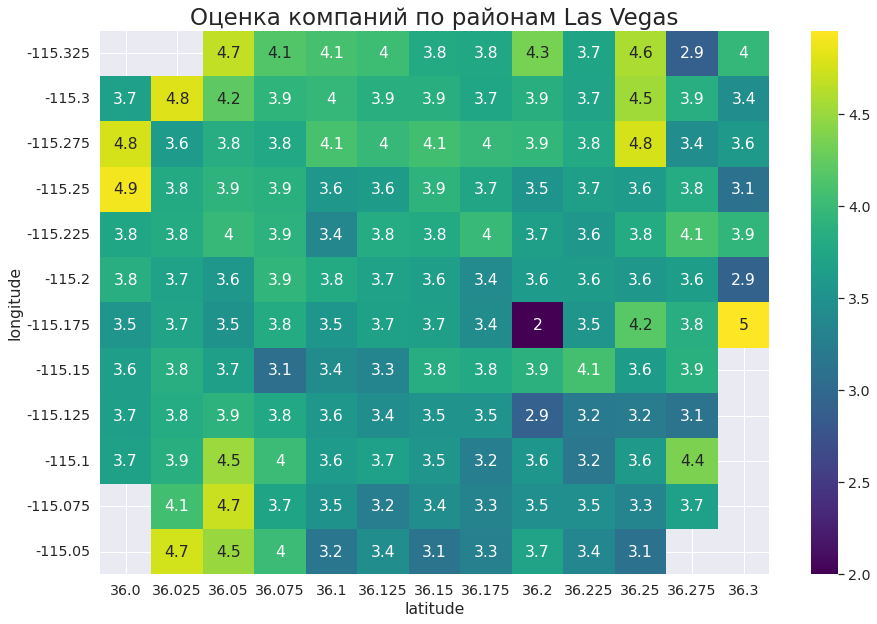

In [44]:
table = pd.pivot_table(
    data=district_businesses,
    values="средняя оценка",
    columns=["latitude"],
    index=["longitude"],
    aggfunc=np.mean,
)
sns.set(font_scale=1.3)
f, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(table, annot=True, cmap="viridis")
plt.title("Оценка компаний по районам Las Vegas", size=23)

Полученный график имеет ряд недостатков. Во-первых, не очень правильно судить о районе, если в нем мало компаний. Во-вторых,  на графике цветовая гамма автоматически подстроилась под минимальное и максимальное значения оценки.

Почему эти недостатки могут быть существенными?

**Ответ:** 
1) Если в нем мало компаний то оценка получилась не объективна изза округления, возможно совсем немного отступив в сторону получим плохие оценки и результаты вообще сильно в этих случаях зависят от способа разбиения на районы  
2) Изза выбросов часть графика достаточно монотонна и сложно разделить 3.5 и 3.9 например, и те оценки которые хотелось бы различать по цвету сходу различить непросто и цвета выходят не репрезентативные  

Оставьте районы, в которых имеется информация о не менее $30$ компаний. Постройте новый график районов, использовав параметры `vmin` и `vmax` у функции `sns.heatmap`.

считаем число компаний в районе

In [45]:
district_grouped_businesses = (
    district_businesses.groupby(by=["latitude", "longitude"])
    .aggregate(np.size)[["name"]]
    .rename(columns={"name": "Num of comp"})
)

выделяем районы, где >= 30 компаний

In [46]:
district_grouped_businesses = district_grouped_businesses[
    district_grouped_businesses["Num of comp"] >= 30
].reset_index()

сделаем df и таблицу для только нужных нам районов

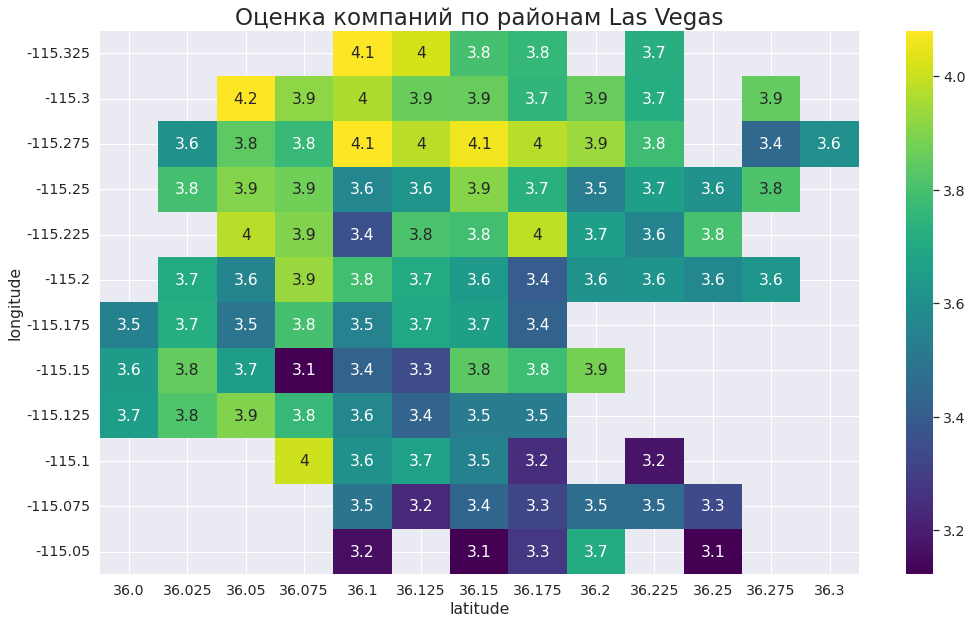

In [47]:
enough = (
    district_businesses.merge(
        district_grouped_businesses,
        how="left",
        indicator=True,
        on=["latitude", "longitude"],
    )
    .query("_merge == 'both'")
    .drop("_merge", axis=1)
    .drop("Num of comp", axis=1)
)

table = pd.pivot_table(
    data=enough,
    values="средняя оценка",
    columns=["latitude"],
    index=["longitude"],
    aggfunc=np.mean,
)
f, ax = plt.subplots(figsize=(17, 10))
sns.heatmap(table, annot=True, cmap="viridis", robust=True)
plt.title("Оценка компаний по районам Las Vegas", size=23)
plt.show()

Сравните полученный график с предыдущим и сделайте вывод.

**Вывод:**
1) Теперь когда в каждом районе >=30 компаний результат более объективен что можно видеть по несильному разбросу между клетками, и сейчас нету слишком высоких и слишком низких оценок, что возможно говорит о том что собрано достаточное кол-во голосов в рамках района  
2) при игнорировании выбросов цвета получились более реперентативные 
3) Несложно видеть, что южнее и западнее рейтинги компаний заметно лучше  

#### Рестораны

Будем считать компанию рестораном, если в поле `categories` *содержится* слово `restaurant`. Обратите внимание, что в анализе данных часто нет четкого формата данных. Например, данное слово может быть написано как с большой буквы, так и с маленькой; может как разделяться `;`, так и не разделяться. При возникновении недопонимания стоит посмотреть данные.

Составьте таблицу, в которой будет информация о всех ресторанах города `N`, для которых имеется не менее $5$ отзывов. Далее постройте heatmap-график районов, в котором каждому району сопоставьте среднюю оценку по ресторанам этого района. Рассматривайте только те районы, в которых есть не менее $10$ ресторанов, для каждого из которых есть не менее $5$ отзывов.

In [48]:
def is_restaurant(series):
    '''определяет для каждого объекта в series кесторан ли это'''
    return series.apply(lambda x: x.lower().find('restaurant') != -1)

рассматриваем только рестораны с >= 5 голосами

In [49]:
restaurants = businesses[is_restaurant(businesses.categories)].copy()
restaurants = restaurants.query("`число голосов` >= 5")
print()

выделяем районы по ресторанам

In [50]:
district_restaurants = restaurants.copy()
district_restaurants.latitude = np.round(restaurants.latitude * 4, decimals=1) * 0.25
district_restaurants.longitude = np.round(restaurants.longitude * 4, decimals=1) * 0.25

рассматриваем районы, где не меньше 10 ресторанов:

In [51]:
district_grouped_restaurants = (
    district_restaurants.groupby(by=["latitude", "longitude"])
    .aggregate(np.size)[["name"]]
    .rename(columns={"name": "Num of comp"})
    .query('`Num of comp` >= 10')
)

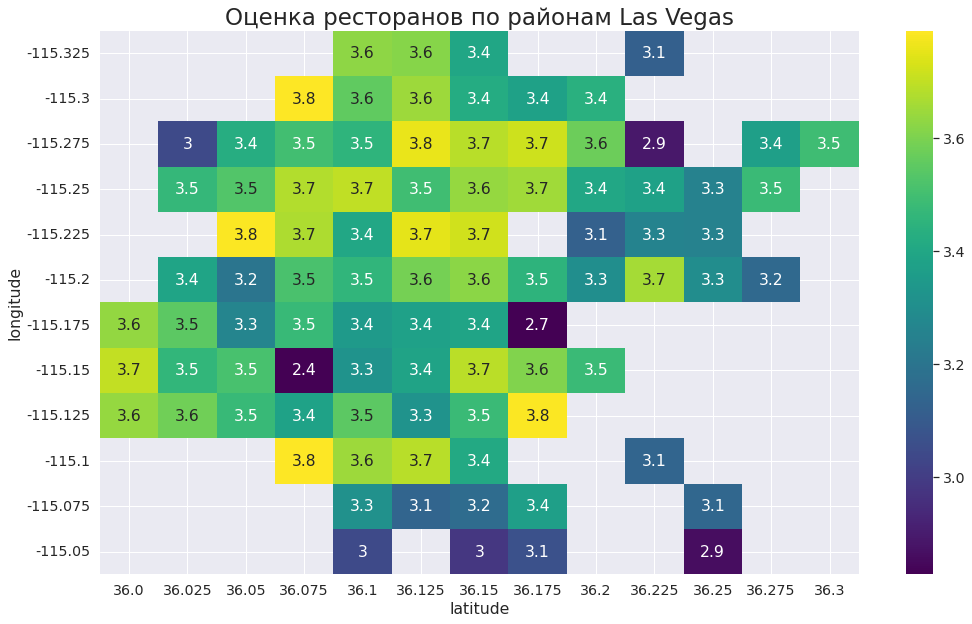

In [52]:
enough1 = (
    district_restaurants.merge(
        district_grouped_restaurants,
        how="left",
        indicator=True,
        on=["latitude", "longitude"],
    )
    .query("_merge == 'both'")
    .drop("_merge", axis=1)
    .drop("Num of comp", axis=1)
)
table = pd.pivot_table(
    data=enough1,
    values="средняя оценка",
    columns=["latitude"],
    index=["longitude"],
    aggfunc=np.mean,
)
f, ax = plt.subplots(figsize=(17, 10))
sns.heatmap(table, annot=True, cmap="viridis", robust=True)
plt.title("Оценка ресторанов по районам Las Vegas", size=23)
plt.show()

Чем полезны ограничения снизу на количество отзывов для ресторана и количество ресторанов в районе?

**Ответ:**  
1) Тем что бывают рестораны с очень малым числом голосов (1-3) которые очевидно могут сложить не объективную оценку  
2) Районы с малым силом ресторанов так же дают не объективную оценку, т.к. малое рассматривается малая выборка и несколько плохих или хороших ресторанов могут сильно влиять на общую картину  

3) рейтинги ресторанов по районам сохраняют тенденции команий в целом и тоже южнее и запал=днее наблюдается лучшие результаты  


Кот Василий из города `N` очень придирчив к выбору ресторана. Он доверяет только ресторанам с высоким рейтингом, который основывается на большом количестве отзывов. Напечатайте в виде таблицы информацию $10$ ресторанах с самым большим рейтингом в порядке убывания рейтинга. Для каждого из этих ресторанов должно быть не менее $50$ отзывов. По каждому ресторану необходимо вывести следующую информации: название ресторана, средняя оценка, количество отзывов, географические координаты, категории.

In [53]:
best_restaurants = (
    restaurants.query("`число голосов` >= 50")
    .sort_values("средняя оценка", ascending=False)[:10]
    .drop("categories", axis=1)
)

Нанесите на карту все рестораны со средней оценкой не менее $4.7$, которая посчитана по не менее $50$ отзывам. Отдельным цветом отметьте 10 ресторанов, которые вы получили ранее.

Для каждого ресторана определим свой цвет т.ч. отдельно будут любимые рестораны Васислия

In [54]:
best_restaurants["Best Rate"] = "Yes"
colored_restaurants = pd.merge(restaurants, best_restaurants, how="left")
colored_restaurants["Best Rate"] = colored_restaurants["Best Rate"].fillna("No")

Строим карту отметив любимые точки Василия

In [55]:
center = dict(lat=businesses["latitude"].mean(), lon=businesses["longitude"].mean())

data = colored_restaurants.query("`средняя оценка` >= 4.7")[
    ["name", "longitude", "latitude", "Best Rate"]
]

fig = px.scatter_mapbox(
    data,
    lat="latitude",
    lon="longitude",
    mapbox_style="carto-positron",
    title="Businesses in Las Vegas",
    zoom=10,
    center=center,
    color="Best Rate",
    size_max=10,
    size=[(lambda x: 4 if x == "Yes" else 2)(x) for x in data["Best Rate"]],
    opacity=0.9,
)

fig.update_layout(
    height=900,
    width=900,  # размер фигуры
    title_text="Лучшие рестораны Las Vegas",  # заголовок графика
    title_font_size=46,  # размер заголовка
)

fig.show()

Охарактеризуйте кота Василия, а также сделайте общий вывод по задаче.

**Вывод:** 
1) Кот Василий в силу своей разборчивости часто кушает западнеe  
2) Любимые рестораны кота Василия находятся довольно далеко друг от друга, наверное это усложняет ему жизнь  
3) Примерно равное кол-во любимых ресторанов Васи находятся слева и справа от дороги, хотя в силу его предпочтений он и бывает чаще западнее  
4) Можно видеть что лучшие рестораны обычно находятся слева от главной улицы(вдоль нее тоже немало)   
5) Лучшие рестораны Вегаса находятся в основном в западной его части   